<a href="https://colab.research.google.com/github/MariaDimopoulou/Churn-Prediction-Customer-Segmentation-in-E-Commerce/blob/main/ChurnPrediction%26CustomerSegmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction**
The data set belongs to a leading online E-Commerce company. An online retail company wants to know the customers who are going to churn, so accordingly they can approach customer to offer some promos. I downloaded the dataset from [Kaggle](https://www.kaggle.com/datasets/ankitverma2010/ecommerce-customer-churn-analysis-and-prediction).

So, my goal was at first to find a proper algorithm in order to predict the churn as accurate as possible and after that to make customer segmenation in order to offer some insight on the different customer categories.

# 1. Inserting all the necessary libaries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import seaborn as sns
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn import datasets
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
np.random.seed(42)

# 2. Exploratory Data Analysis (EDA) & Descriptive Statistics

In [ ]:
data=pd.read_excel(r'E Commerce Dataset.xlsx',sheet_name="E Comm")
print(data.shape)
print(data.info())
print(data.head())
statistics_initial = data.describe()
print(statistics_initial)


(5630, 20)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberO

So, here at first we can see the shape of our data, what do the data look like and what is their general type. If it is float, int etc. Another  thing we can see is some statistics that are going to be usefull later on when we process the data in order to see if we have caused any distortion.


<ipython-input-7-60ed6ba8b86c>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=False)


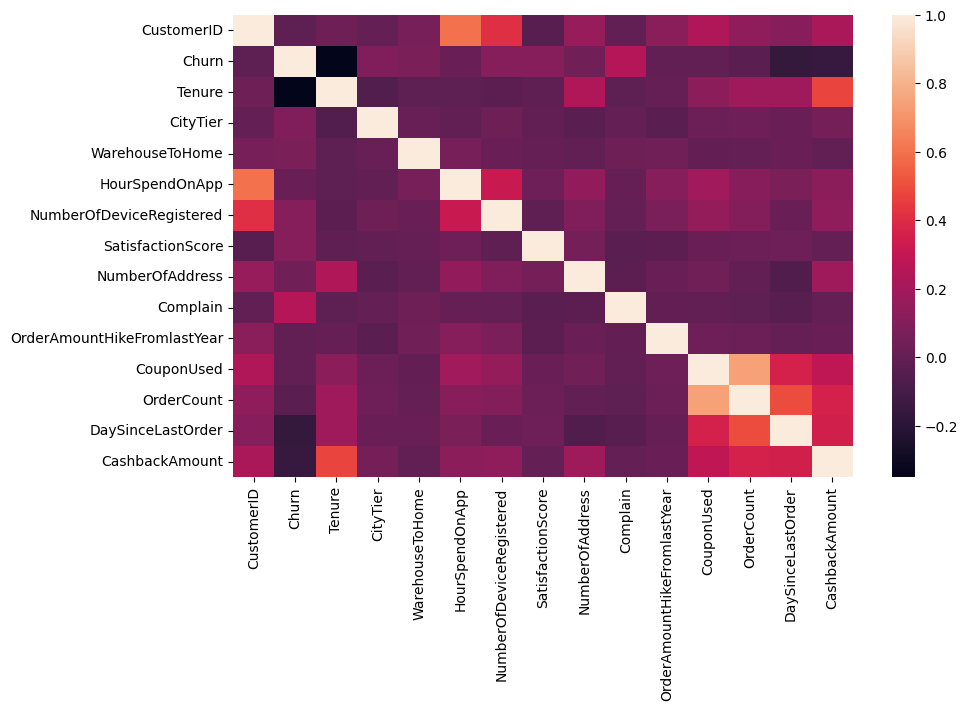

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
sns.heatmap(data.corr(), annot=False)
plt.show()


Here, we check the correlation between the variables and as we see there is no big correlation between them. We can see bigger correlation between OrderCount and CouponUsed so I should probably use only one of them in my model later on but for now I am not going to handle this.

0    4682
1     948
Name: Churn, dtype: int64


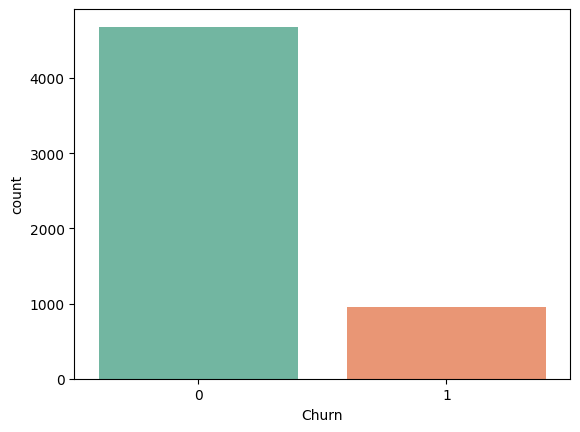

In [ ]:
print(data["Churn"].value_counts())
sns.countplot(x="Churn", data=data)
sns.countplot(x="Churn", data=data, palette="Set2")
plt.show()

At this point, we realise that our data are imbalanced. We will have to handle this in the next step.

DaySinceLastOrder              5.452931
OrderAmountHikeFromlastYear    4.706927
Tenure                         4.689165
OrderCount                     4.582593
CouponUsed                     4.547069
HourSpendOnApp                 4.529307
WarehouseToHome                4.458259
CustomerID                     0.000000
MaritalStatus                  0.000000
Complain                       0.000000
NumberOfAddress                0.000000
PreferedOrderCat               0.000000
SatisfactionScore              0.000000
Churn                          0.000000
NumberOfDeviceRegistered       0.000000
Gender                         0.000000
PreferredPaymentMode           0.000000
CityTier                       0.000000
PreferredLoginDevice           0.000000
CashbackAmount                 0.000000
dtype: float64


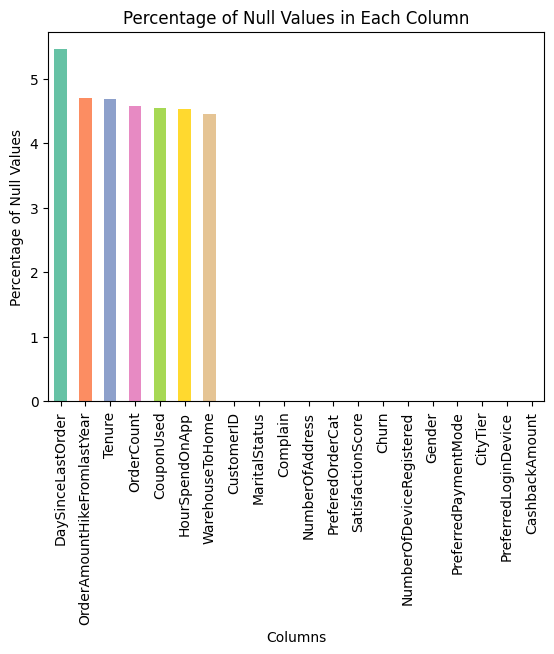

In [ ]:
sorted_null=(data.isnull().sum()*100/len(data)).sort_values(ascending=False)
print(sorted_null)
color_palette = sns.color_palette("Set2")
sorted_null.plot(kind='bar', color=color_palette)
plt.xlabel('Columns')
plt.ylabel('Percentage of Null Values')
plt.title('Percentage of Null Values in Each Column')
plt.show()


We can also see that we have some missing values. Most of thame are in the DaySinceLastOrder column. The percentage is not that big, it is aroun 5%. However, in the next section we will handle all ot the missing values.

# 3. Data Preprocessing: Handling Missing Values and Balance the Data, Finding Outliers, and Encoding Categorical Variables.

**Outliers:**

We are trying to find out if we have any outliers before handling the missing values so that we can choose the best method.

In [ ]:
data['DaySinceLastOrder'].value_counts(dropna=False) #Maybe 30,31,46 outliers
data['OrderAmountHikeFromlastYear'].value_counts(dropna=False) #No outliers
data['Tenure'].value_counts(dropna=False) #Maybe 50, 51,60 and 61 outliers
data['OrderCount'].value_counts(dropna=False) #No outliers
data['CouponUsed'].value_counts(dropna=False) #No ourliers
data['HourSpendOnApp'].value_counts(dropna=False) #2 outliers: 0 and 5
#data['WarehouseToHome'].value_counts(dropna=False) #2 outliers:126 and 127


3.0    2687
2.0    1471
4.0    1176
NaN     255
1.0      35
0.0       3
5.0       3
Name: HourSpendOnApp, dtype: int64

At first, we take a look in each of the columns that we have missing values to see what kind of values they have and how much of the data are corresponding to each one of the values. In this way we have a first idea of where our outliers are probably lying.

In [ ]:
def find_outliers_IQR(df):
   q1=df.quantile(0.25)
   q3=df.quantile(0.75)
   IQR=q3-q1
   upper_limit = q3 + (IQR * 1.5)
   lower_limit = q1 - (IQR * 1.5)
   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers,upper_limit,lower_limit

outliers = find_outliers_IQR(data['WarehouseToHome'])[0]
print('number of outliers in WarehouseToHome: '+ str(len(outliers)))
print('max outlier value: '+ str(outliers.max()))
print('min outlier value: '+ str(outliers.min()))

outliers = find_outliers_IQR(data['DaySinceLastOrder'])[0]
print('number of outliers in DaySincelastOrder: '+ str(len(outliers)))
print('max outlier value: '+ str(outliers.max()))
print('min outlier value: '+ str(outliers.min()))


outliers = find_outliers_IQR(data['Tenure'])[0]
print('number of outliers in Tenure: '+ str(len(outliers)))
print('max outlier value: '+ str(outliers.max()))
print('min outlier value: '+ str(outliers.min()))


outliers = find_outliers_IQR(data['HourSpendOnApp'])[0]
print('number of outliers in HourSpendOnApp: '+ str(len(outliers)))
print('max outlier value: '+ str(outliers.max()))
print('min outlier value: '+ str(outliers.min()))

number of outliers in WarehouseToHome: 2
max outlier value: 127.0
min outlier value: 126.0
number of outliers in DaySincelastOrder: 62
max outlier value: 46.0
min outlier value: 15.0
number of outliers in Tenure: 4
max outlier value: 61.0
min outlier value: 50.0
number of outliers in HourSpendOnApp: 6
max outlier value: 5.0
min outlier value: 0.0


In the next step, we are using a statistical method called Interquartile Range* (IQR) to check for the outliers and gain more confidence on what is going on.

**IQR: It measures the spread or variability of a dataset. It is the range between the first quartile and the third quartile of the dataset. Values that fall below Q1 - 1.5 * IQR or above Q3 + 1.5 * IQR are typically considered outliers.*

**Handling the Outliers:**

Now we will handle the outliers because they could cause distortion in the way will handle missing values and they could alse cause trouble in our results in the algorithms that we will use below.

In [ ]:
data['WarehouseToHome']=np.where(data["WarehouseToHome"]>find_outliers_IQR(data["WarehouseToHome"])[1],find_outliers_IQR(data["WarehouseToHome"])[1],
                                 np.where(data["WarehouseToHome"]<find_outliers_IQR(data["WarehouseToHome"])[2],find_outliers_IQR(data["WarehouseToHome"])[2],data['WarehouseToHome']))
data['DaySinceLastOrder']=np.where(data["DaySinceLastOrder"]>find_outliers_IQR(data["DaySinceLastOrder"])[1],find_outliers_IQR(data["DaySinceLastOrder"])[1],
                                 np.where(data["DaySinceLastOrder"]<find_outliers_IQR(data["DaySinceLastOrder"])[2],find_outliers_IQR(data["DaySinceLastOrder"])[2],data['DaySinceLastOrder']))
data['Tenure']=np.where(data["Tenure"]>find_outliers_IQR(data["Tenure"])[1],find_outliers_IQR(data["Tenure"])[1],
                                 np.where(data["Tenure"]<find_outliers_IQR(data["Tenure"])[2],find_outliers_IQR(data["Tenure"])[2],data['Tenure']))
data['HourSpendOnApp']=np.where(data["HourSpendOnApp"]>find_outliers_IQR(data["HourSpendOnApp"])[1],find_outliers_IQR(data["HourSpendOnApp"])[1],
                                 np.where(data["HourSpendOnApp"]<find_outliers_IQR(data["HourSpendOnApp"])[2],find_outliers_IQR(data["HourSpendOnApp"])[2],data['HourSpendOnApp']))

We will use the technique capping outliers using the IQR Ranges of upper and lower limit from our function .
This means that the outliers will take either the lower or the upper limit values from our normal distributed values.

**Handling Missing Values:**

In [ ]:
imputer=KNNImputer(n_neighbors=10)
columns_to_impute = ['DaySinceLastOrder', 'OrderAmountHikeFromlastYear', 'Tenure',
                     'OrderCount', 'CouponUsed', 'HourSpendOnApp', 'WarehouseToHome']
data[columns_to_impute] = imputer.fit_transform(data[columns_to_impute])
data[columns_to_impute] = data[columns_to_impute].round().astype(int)

#Let's check now if we filled all the missingvalues.
sorted_null=(data.isnull().sum()*100/len(data)).sort_values(ascending=False)
print(sorted_null)

CustomerID                     0.0
Churn                          0.0
DaySinceLastOrder              0.0
OrderCount                     0.0
CouponUsed                     0.0
OrderAmountHikeFromlastYear    0.0
Complain                       0.0
NumberOfAddress                0.0
MaritalStatus                  0.0
SatisfactionScore              0.0
PreferedOrderCat               0.0
NumberOfDeviceRegistered       0.0
HourSpendOnApp                 0.0
Gender                         0.0
PreferredPaymentMode           0.0
WarehouseToHome                0.0
CityTier                       0.0
PreferredLoginDevice           0.0
Tenure                         0.0
CashbackAmount                 0.0
dtype: float64


Here, we are using KNN method to handle the missing values. The KNN algorithm calculates the distance between the samples in the dataset and selects the 10 nearest neighbors (in our case) to estimate the missing value.

The estimated value for a missing data point is the mean from the available values of its nearest neighbors.

After that, we are just checking if we indeed handled all the missing values to make sure that we are ready to proceed.

**Handling Categorical Variables & Clean the Data:**

We can see that there are many issues in our data. We have categorical variables that we shoudl handle before applying any algorithm and we alse have some minor issues like having double values that apply at the same value in some of our columns.



In [ ]:
data['PreferredLoginDevice'].value_counts(dropna=False)
print(data["PreferredLoginDevice"])
data['PreferredLoginDevice']=data['PreferredLoginDevice'].map({'Mobile Phone':1, "Phone":1,'Computer':0})
print(data["PreferredLoginDevice"])

0       Mobile Phone
1              Phone
2              Phone
3              Phone
4              Phone
            ...     
5625        Computer
5626    Mobile Phone
5627    Mobile Phone
5628        Computer
5629    Mobile Phone
Name: PreferredLoginDevice, Length: 5630, dtype: object
0       1
1       1
2       1
3       1
4       1
       ..
5625    0
5626    1
5627    1
5628    0
5629    1
Name: PreferredLoginDevice, Length: 5630, dtype: int64


We see that there are two values that seem to be the same, mobile phone and phone so we are going to use one hot encoding and represent both of these values with the number 1 and the computer with the number 0.

In [ ]:
data['PreferredPaymentMode'].value_counts(dropna=False)
categorical_data = data["PreferredPaymentMode"].values.reshape(-1, 1)
encoder = OneHotEncoder()
encoder.fit(categorical_data)
one_hot_encoded_data = encoder.transform(categorical_data).toarray()
categories = encoder.categories_[0]
column_names = [f"PreferredPaymentMode_{category}" for category in categories]
encoded_df = pd.DataFrame(one_hot_encoded_data, columns=column_names)
data = pd.concat([data.drop("PreferredPaymentMode", axis=1), encoded_df], axis=1)

Above, we have 7 different payment methods and we use one hot encoding to make them numeric values. At the end of the code we replace the previous column with the numeric ones.

In [ ]:
data['Gender'].value_counts(dropna=False)
data['Gender']=data['Gender'].map({'Female':1,'Male':0})

In the same way above, we use one hot encoding for the gender and we assign 1 to Female and 0 to Male.

In [ ]:
data['PreferedOrderCat'].value_counts(dropna=False)
data['PreferedOrderCat']=data['PreferedOrderCat'].map({'Laptop & Accessory':0,'Mobile Phone':1,'Mobile':1,'Fashion':2,'Others':3,'Grocery':4})
data['MaritalStatus'].value_counts(dropna=False)
data['MaritalStatus']=data['MaritalStatus'].map({'Married':0,'Divorced':1,'Single':2})

However in these specific columns I will choose a different approach and I will try label encoding. The reason for that is that it makes more sense for the products to be in a specific order and closer to each other as this could be a reason for churn.

*For example*, laptop and accesosory seem closer as a purchase to mobile phone that to grocery. The same applies for fashion that seems to be closer to technology or others than it might be in grocery.
The same logic applies to marital status. Meaning that someone who is single is a little further from the married ones and closer to the divorced ones. However, this could be totally different and I mostly chose it to have a little more variety in the methods that I used.

# 3. Classification Methods : Model Selection and Evaluation

**Split the data into Training and Test Set**

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(data[['Tenure','PreferredLoginDevice','CityTier',\
                                                     'WarehouseToHome','PreferredPaymentMode_CC','PreferredPaymentMode_COD',\
                                                         'PreferredPaymentMode_Cash on Delivery','PreferredPaymentMode_Credit Card',\
                                                            'PreferredPaymentMode_Debit Card', 'PreferredPaymentMode_E wallet','PreferredPaymentMode_UPI'  ,\
                                                         'Gender','HourSpendOnApp','NumberOfDeviceRegistered',\
                                                             'PreferedOrderCat','SatisfactionScore','MaritalStatus',\
                                                                 'Complain','OrderAmountHikeFromlastYear',\
                                                                     'CouponUsed','DaySinceLastOrder','CashbackAmount']],data['Churn'],test_size=0.33,random_state=42)
#'OrderCount'- removed or added to check correlation with coupon used

**Classification with Imbalanced Data:**

At first, I am not going to handle the imbalanced data and I will try using my classification algorithms directly to the data I have until now.

**Random Forest:**

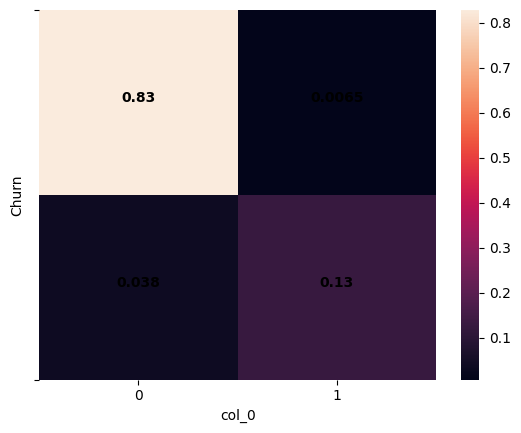

Accuracy: 0.9558665231431647
Precision: 0.9518072289156626
Recall: 0.7719869706840391
F1-score: 0.8525179856115107
AUC-ROC: 0.8821250133884412


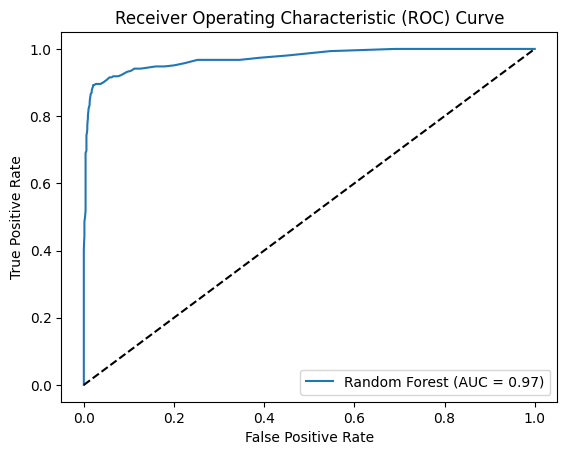

In [ ]:
clf = RandomForestClassifier(class_weight='balanced', random_state=0)
clf.fit(x_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(x_test)

#Create a cross-matrix and visualize it
crosstab = pd.crosstab(y_test, y_pred, dropna=False, normalize='all')
akws = {"va": 'baseline', "fontweight": 'bold', "color": 'black'}
ax = plt.subplot()
sns.heatmap(crosstab, annot=True, ax=ax, annot_kws=akws)
ax.set(yticks=[0, 2], xticks=[0.5, 1.5])
plt.show()

# Evaluate the accuracy of the classifier
acc = accuracy_score(y_test, y_pred, normalize=True)
print(f'Accuracy: {acc}')
precision = precision_score(y_test, y_pred)
print(f'Precision: {precision}')
# Calculate recall
recall = recall_score(y_test, y_pred)
print(f'Recall: {recall}')
# Calculate F1-score
f1 = f1_score(y_test, y_pred)
print(f'F1-score: {f1}')
# Calculate AUC-ROC
auc_roc = roc_auc_score(y_test, y_pred)
print(f'AUC-ROC: {auc_roc}')

y_pred_proba = clf.predict_proba(x_test)[:, 1]

# Calculate false positive rate, true positive rate, and threshold values for ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate the AUC-ROC score
auc_roc = roc_auc_score(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {auc_roc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


Overall, the performance metrics suggest that the model has achieved high accuracy, precision, and AUC-ROC score. However, the recall score is comparatively lower, indicating that the model may have some difficulty in correctly identifying positive instances (we can alse see that from the confusion matrix)

**XGBOOST**

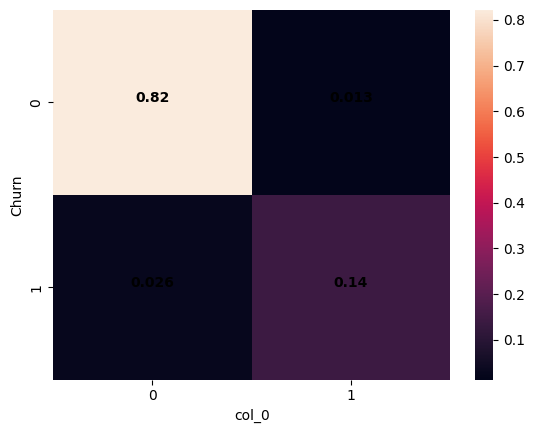

Accuracy: 0.961248654467169
Precision: 0.9151943462897526
Recall: 0.8436482084690554
F1-score: 0.8779661016949153
AUC-ROC: 0.914087160327371


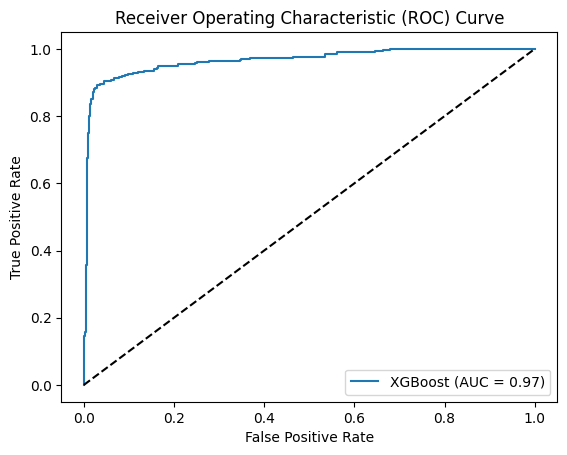

In [ ]:
# Create and train XGBoost classifier
cl_xgb1 = xgb.XGBClassifier(n_estimators=100)
cl_xgb1.fit(x_train, y_train)

# Predict
y_pred = cl_xgb1.predict(x_test)

# Plot cross table
crosstab = pd.crosstab(y_test, y_pred, dropna=False,normalize='all')
akws = {"va": 'baseline', "fontweight": 'bold', "color": 'black'}
ax = sns.heatmap(crosstab, annot=True, annot_kws=akws)
plt.show()

# Calculate accuracy
acc = accuracy_score(y_test, y_pred, normalize=True)
print(f'Accuracy: {acc}')
precision = precision_score(y_test, y_pred)
print(f'Precision: {precision}')
# Calculate recall
recall = recall_score(y_test, y_pred)
print(f'Recall: {recall}')
# Calculate F1-score
f1 = f1_score(y_test, y_pred)
print(f'F1-score: {f1}')
# Calculate AUC-ROC
auc_roc = roc_auc_score(y_test, y_pred)
print(f'AUC-ROC: {auc_roc}')

# Get predicted probabilities
y_pred_proba = cl_xgb1.predict_proba(x_test)[:, 1]

# Calculate false positive rate, true positive rate, and threshold values for ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate the AUC-ROC score
auc_roc = roc_auc_score(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label=f'XGBoost (AUC = {auc_roc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()



Overall, the updated performance metrics for the XGBoost classifier show improvements in accuracy, recall, and AUC-ROC compared to the previous metrics. However, there is a slight decrease in precision, but in my opinion overall it performs better.

**Logistic Regression:**

In [ ]:

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(x_train)
X_test = scaler.transform(x_test)

# Create and train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

# Print the evaluation metrics
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1-score: {f1:.4f}')
print(f'AUC-ROC: {roc_auc:.4f}')

Accuracy: 0.8886
Precision: 0.7778
Recall: 0.4560
F1-score: 0.5749
AUC-ROC: 0.7151


We can see that the scores fore Logistic Regression are much worse than the ones for Random Forest and xgboost so we will not take it into consideration.

**Classification with Balanced Data:**

In this section we will balance our data in order to improve the scores in our classification algorithms.

In [ ]:
over_sampler = SMOTE(sampling_strategy='minority')
under_sampler = RandomUnderSampler(sampling_strategy='majority')
steps = [('over', over_sampler), ('under', under_sampler)]
pipeline = Pipeline(steps=steps)

x_train_balanced, y_train_balanced = pipeline.fit_resample(x_train, y_train)

Here, we are using a combination of over-sampling and under-sampling techniques:
*   SMOTE: create synthetic samples from the minority class to balance the distribution.
*   RandomUnderSampler: removes samples from the majority class to balance the class distribution.

**Random Forest:**

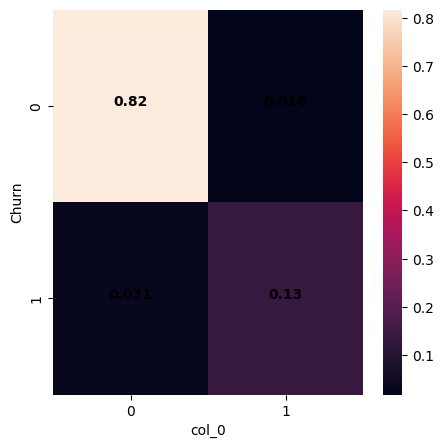

Accuracy: 0.9510226049515608
Precision: 0.8829787234042553
Recall: 0.8110749185667753
F1-score: 0.8455008488964346
AUC-ROC: 0.8948991614110471


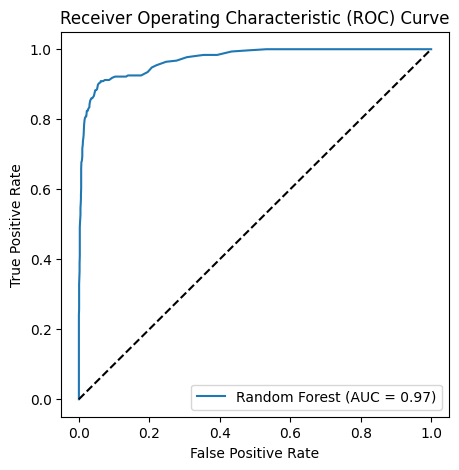

In [ ]:
# Build and train the Random Forest classifier
clf = RandomForestClassifier(class_weight='balanced', random_state=0)
clf.fit(x_train_balanced, y_train_balanced)

# Make predictions on the test set
y_pred = clf.predict(x_test)

# Evaluate the classifier
acc = accuracy_score(y_test, y_pred, normalize=True)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc_roc = roc_auc_score(y_test, y_pred)

crosstab = pd.crosstab(y_test, y_pred, dropna=False,normalize='all')
akws = {"va": 'baseline', "fontweight": 'bold', "color": 'black'}
ax = sns.heatmap(crosstab, annot=True, annot_kws=akws)
plt.show()

# Print the evaluation metrics
print(f'Accuracy: {acc}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-score: {f1}')
print(f'AUC-ROC: {auc_roc}')


# Calculate probabilities for positive class (churn)
y_pred_proba = clf.predict_proba(x_test)[:, 1]

# Calculate false positive rate, true positive rate, and threshold values for ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate the AUC-ROC score
auc_roc = roc_auc_score(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {auc_roc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


We can see that after balancing the data if we compare this algorithm with the random forest before the balancing, the precision has decreased while the recall and auc-roc score have increased. The rest are pretty much the same. So, it indeed helped a bit to improve our results. However, if we compare it with the xgboost's results here we have worse scores in almoste every metric.

**XGBOOST:**

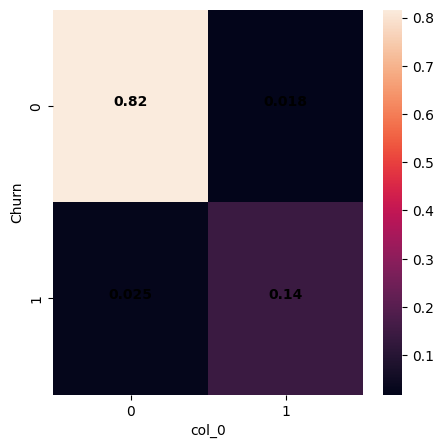

Accuracy: 0.9569429494079655
Precision: 0.8847457627118644
Recall: 0.8501628664495114
F1-score: 0.8671096345514951
AUC-ROC: 0.9141207626896171


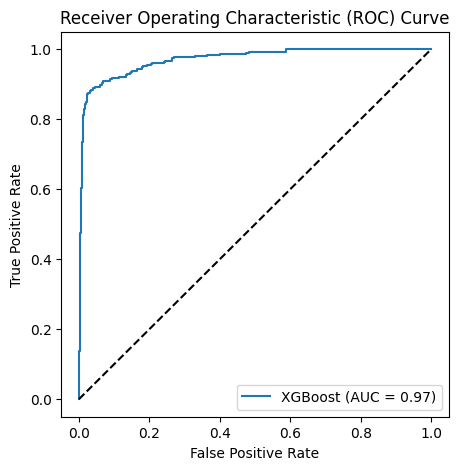

In [ ]:
cl_xgb = xgb.XGBClassifier(n_estimators=100)
cl_xgb.fit(x_train_balanced, y_train_balanced)

# Predict
y_pred = cl_xgb.predict(x_test)

# Evaluate the classifier
acc = accuracy_score(y_test, y_pred, normalize=True)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc_roc = roc_auc_score(y_test, y_pred)

crosstab = pd.crosstab(y_test, y_pred, dropna=False,normalize='all')
akws = {"va": 'baseline', "fontweight": 'bold', "color": 'black'}
ax = sns.heatmap(crosstab, annot=True, annot_kws=akws)
plt.show()

# Print the evaluation metrics
print(f'Accuracy: {acc}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-score: {f1}')
print(f'AUC-ROC: {auc_roc}')

# Calculate probabilities for positive class (churn)
y_pred_proba = cl_xgb.predict_proba(x_test)[:, 1]

# Calculate false positive rate, true positive rate, and threshold values for ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate the AUC-ROC score
auc_roc = roc_auc_score(y_test, y_pred_proba)

# Plot the ROC curve
plt.plot(fpr, tpr, label=f'XGBoost (AUC = {auc_roc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

If we compare this algorithm to the random forest without balancing the results are better in all metrics except the precision. However, if we compare it to the xgboost before balancing the data we can see that every score except for accuracy is better before balancing the data or it is pretty much the same.

*So, if I should choose an algorithm to go I would choose the xgboost before balancing the data.*

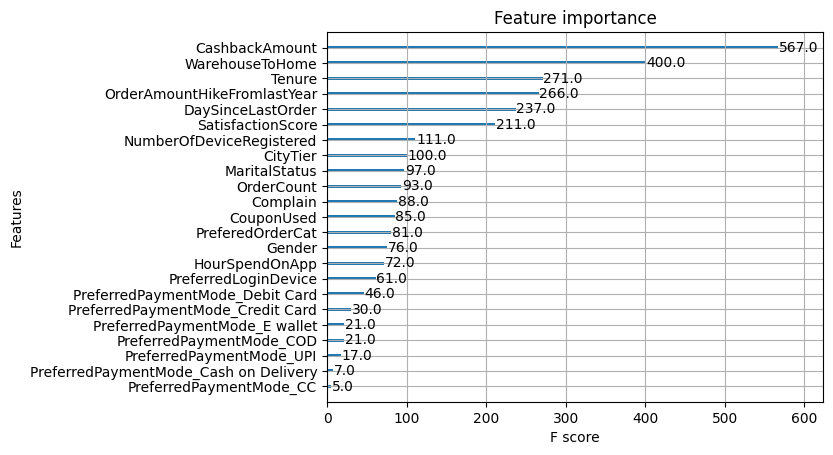

In [ ]:
# Plot variable importance
xgb.plot_importance(cl_xgb1)
plt.rcParams['figure.figsize'] = [5, 5]
plt.show()

Here, we are checking which variables seem to be more important in the algorithm that we chose above. It seems that CashBackAmount and WareHouseToHome are the two most important parameters.By examining the variable importance in a model, we can gain insights into the factors that have the most significant impact on customers churning.

In [ ]:
#pd.set_option('display.max_columns', None)
statistics_final = data.describe()
print(statistics_final-statistics_initial)


       CashbackAmount  Churn  CityTier  Complain  CouponUsed  CustomerID  \
count        0.000000    0.0  0.000000  0.000000  256.000000         0.0   
mean      -177.223030    0.0 -1.654707 -0.284902   -1.751023         0.0   
std        -48.206947    0.0  0.084700  0.548681   -0.894533         0.0   
min         -3.601899    0.0 -1.715286 -0.631198   -0.938282         0.0   
25%       -146.409255    0.0 -1.715286 -0.631198   -1.409712         0.0   
50%       -163.563380    0.0 -1.715286 -0.631198   -1.409712         0.0   
75%       -196.002898    0.0 -1.530229  0.584290   -1.881142         0.0   
max       -321.986769    0.0 -1.530229  0.584290   -8.481163         0.0   

       DaySinceLastOrder  Gender  HourSpendOnApp  MaritalStatus  \
count         307.000000     NaN      255.000000            NaN   
mean           -4.543491     NaN       -2.931535            NaN   
std            -2.654344     NaN        0.278163            NaN   
min            -1.311653     NaN       -4.07801

Here, we are checking if all the data processing that we did have caused distortion in our data statistics. As we can see, there are no much differences. The only differences are in the variables that we used to handle the missing values and remove the outliers.

# 4. Clustering Methods

**Silhouette:**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

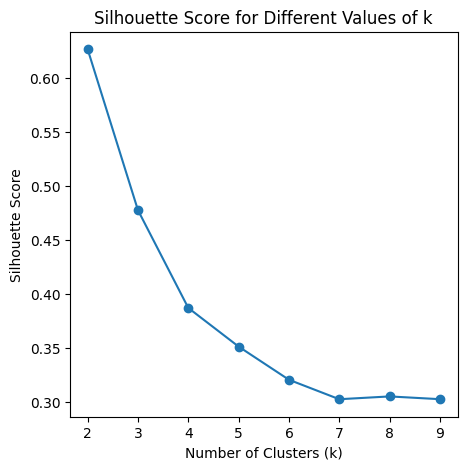

In [ ]:
# Select the columns for clustering
columns_for_clustering = ['Tenure', 'PreferredLoginDevice', 'CityTier', 'WarehouseToHome', 'PreferredPaymentMode_CC',
                          'PreferredPaymentMode_COD', 'PreferredPaymentMode_Cash on Delivery',
                          'PreferredPaymentMode_Credit Card', 'PreferredPaymentMode_Debit Card',
                          'PreferredPaymentMode_E wallet', 'PreferredPaymentMode_UPI', 'Gender', 'HourSpendOnApp',
                          'NumberOfDeviceRegistered', 'PreferedOrderCat', 'SatisfactionScore', 'MaritalStatus',
                          'Complain', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount', 'DaySinceLastOrder',
                          'CashbackAmount']

# Define the range of k values to try
k_values = range(2, 10)

# Initialize variables
silhouette_scores = []

# Iterate over different k values
for k in k_values:
    # Perform K-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data[columns_for_clustering])

    # Calculate the silhouette score
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(data[columns_for_clustering], labels)

    # Store the silhouette score
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different Values of k')
plt.xticks(k_values)
plt.show()

Silhouette seems to suggest 2 as the ideal number of clusters.

**Elbow Method:**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

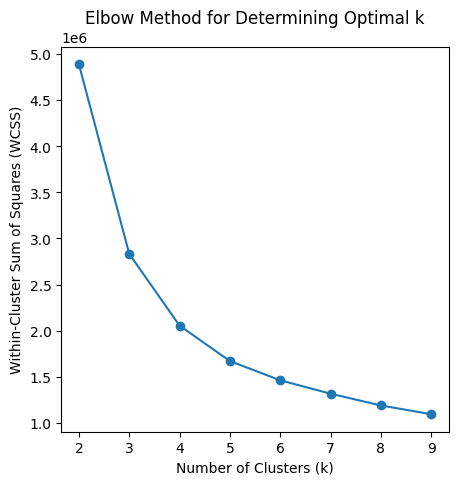

In [ ]:
wcss = []

# Define the range of k values to try
k_values = range(2, 10)

# Iterate over different k values
for k in k_values:
    # Perform K-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data[columns_for_clustering])

    # Calculate the within-cluster sum of squares (WCSS)
    wcss.append(kmeans.inertia_)

# Plot the WCSS values
plt.plot(k_values, wcss, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Determining Optimal k')
plt.xticks(k_values)
plt.show()

The elbow method suggests 4 clusters. So, we are going to make trials with both numbers and see our results.

**K-Means**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


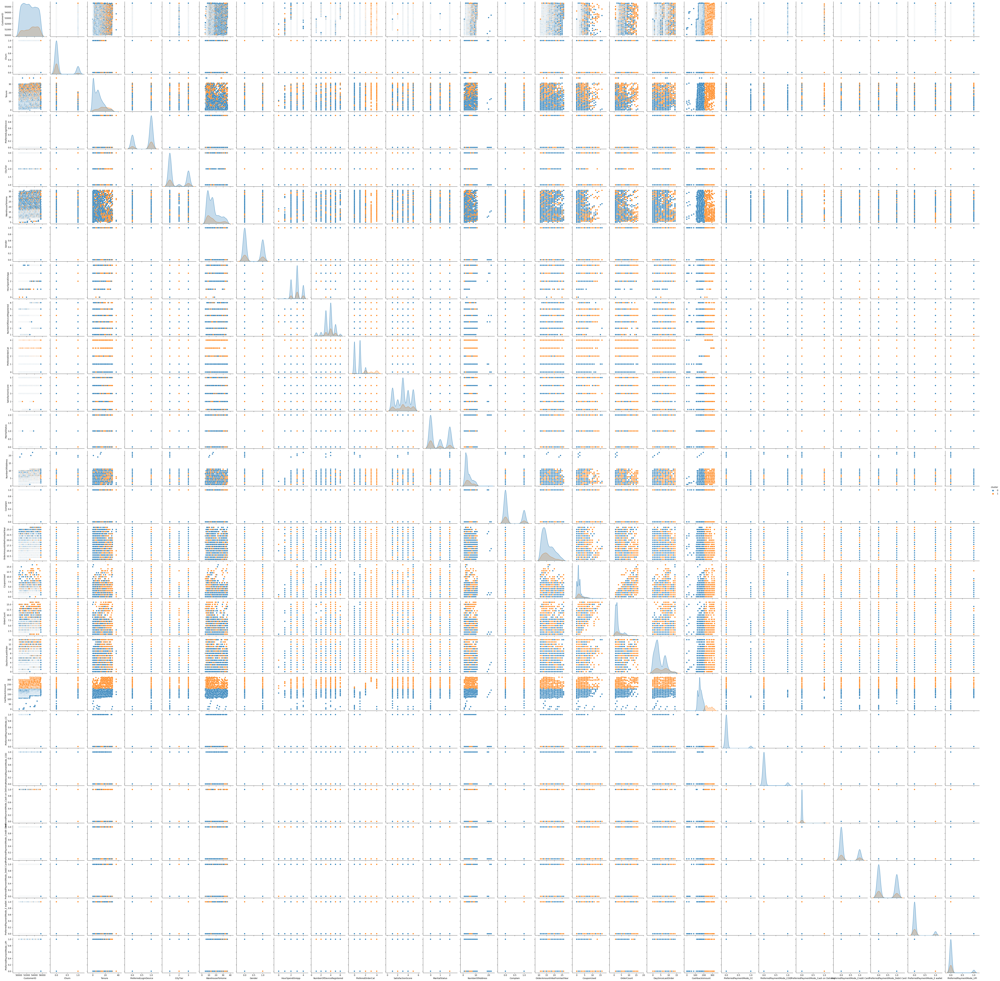

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans = kmeans.fit(data[columns_for_clustering])

# Append results
data['cluster'] = kmeans.labels_

# Plot result
sns.pairplot(data, hue='cluster')
plt.show()

**K-Means with Standardization & dimensionality reduction (PCA)**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


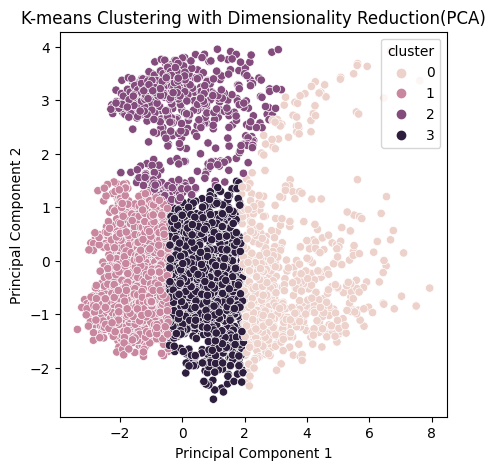

In [ ]:
scaler = StandardScaler()
data[columns_for_clustering] = scaler.fit_transform(data[columns_for_clustering])

# Perform dimensionality reduction (PCA)
pca = PCA(n_components=2)
data_reduced = pca.fit_transform(data[columns_for_clustering])

# Apply K-means clustering
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans = kmeans.fit(data_reduced)
# Append results
data['cluster'] = kmeans.labels_

# Plot result
sns.scatterplot(x=data_reduced[:, 0], y=data_reduced[:, 1], hue=data['cluster'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clustering with Dimensionality Reduction(PCA)')
plt.show()

**K-Means with Standardizationd & Dimensionality Reduction (t-SNE)**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


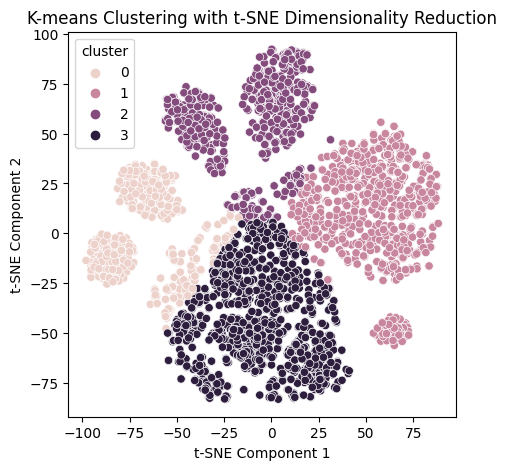

In [ ]:
# Perform normalization
scaler = StandardScaler()
data[columns_for_clustering] = scaler.fit_transform(data[columns_for_clustering])

# Perform dimensionality reduction (t-SNE)
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(data[columns_for_clustering])

# Apply K-means clustering
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans = kmeans.fit(tsne_result)

# Append results
data['cluster'] = kmeans.labels_

# Plot result
sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=data['cluster'])
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('K-means Clustering with t-SNE Dimensionality Reduction')
plt.show()

**DBSCAN with Standardizarion & Dimensionality Reduction (PCA)**

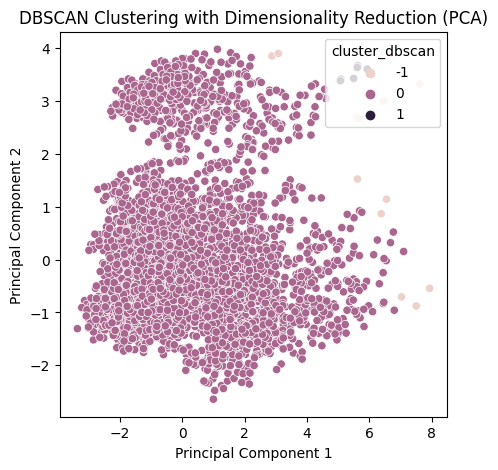

In [ ]:

# Apply DBSCAN clustering
db_cl = DBSCAN()
db_cl = db_cl.fit(data_reduced)

# Append results to the original data
data['cluster_dbscan'] = db_cl.labels_

# Plot DBSCAN result
sns.scatterplot(x=data_reduced[:, 0], y=data_reduced[:, 1], hue=data['cluster_dbscan'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clustering with Dimensionality Reduction (PCA)')
plt.show()

**DBSCAN with Standardization & Dimensionality Reduction (t-SNE)**

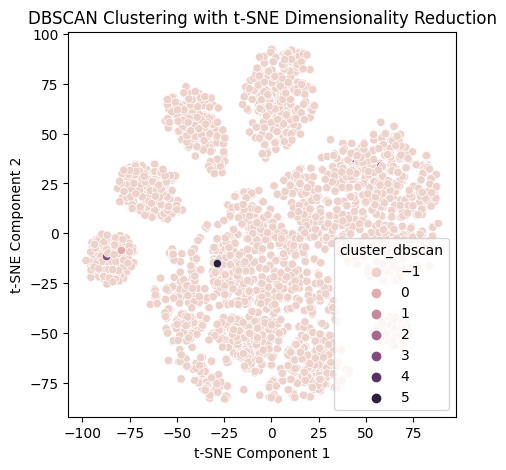

In [ ]:
# Apply DBSCAN clustering
db_cl = DBSCAN()
db_cl = db_cl.fit(tsne_result)

# Append results to the original data
data['cluster_dbscan'] = db_cl.labels_

# Plot DBSCAN result
sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=data['cluster_dbscan'])
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('DBSCAN Clustering with t-SNE Dimensionality Reduction')
plt.show()


**Hierarchical with Standardization & t-SNE **

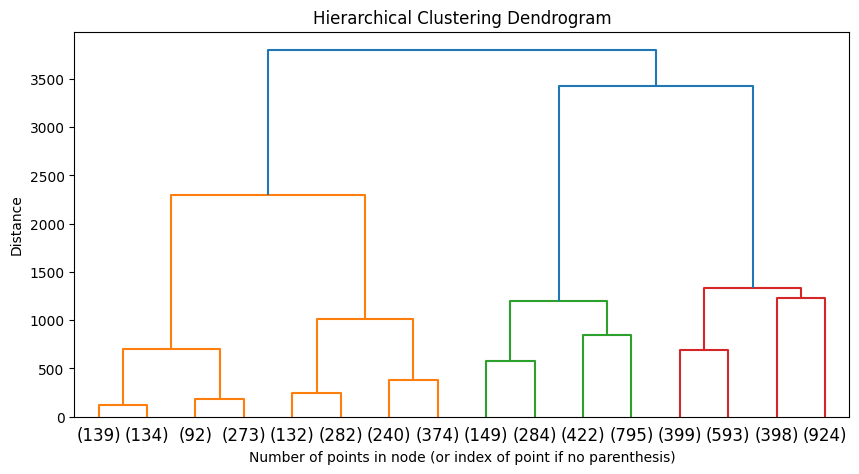

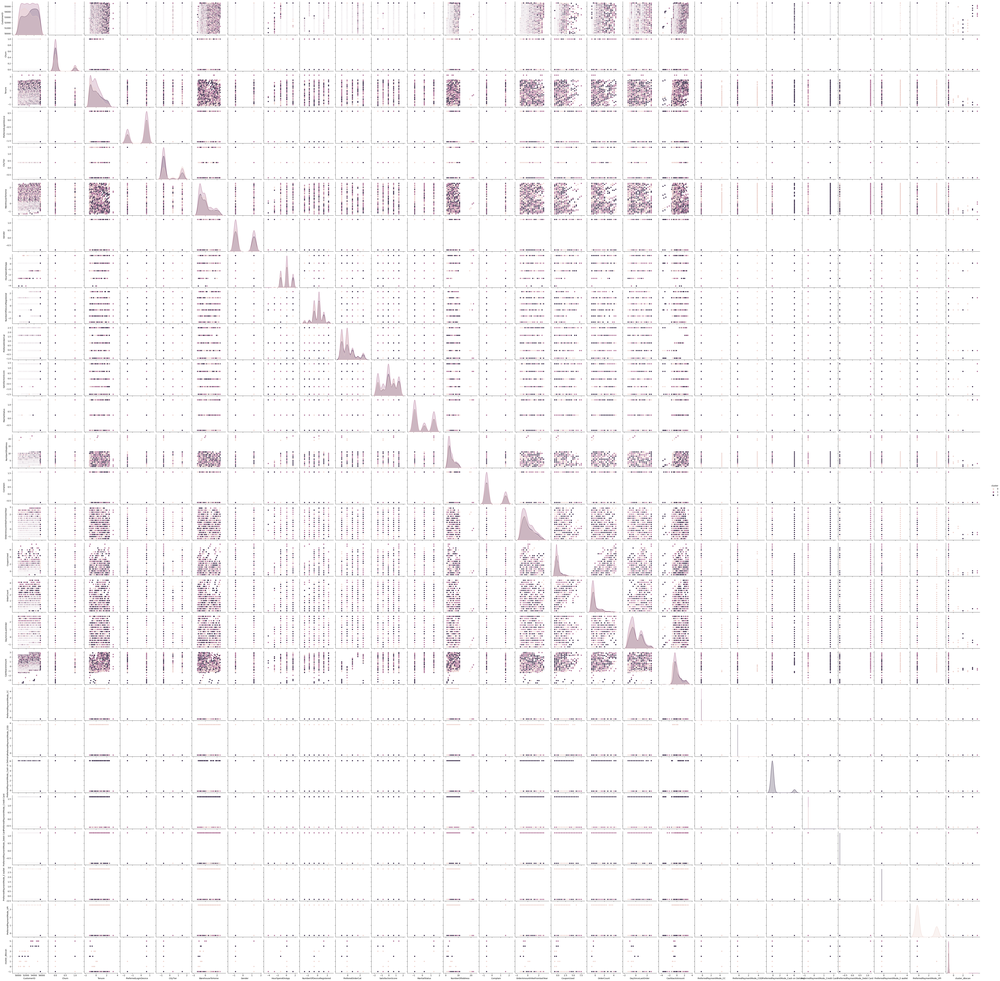

In [ ]:
# Apply hierarchical clustering and plot the dendrogram
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(tsne_result)
Z = linkage(tsne_result, method='ward')
plt.figure(figsize=(10, 5))
dendrogram(Z, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis)")
plt.ylabel("Distance")
plt.title("Hierarchical Clustering Dendrogram")
plt.show()

# Apply hierarchical clustering to create three clusters
hc = AgglomerativeClustering(n_clusters=3)
hc = hc.fit(tsne_result)

# Append results
data['cluster'] = hc.labels_

# Plot result
sns.pairplot(data, hue='cluster')
plt.show()


It seems that K-Means with t-SNE for dimensionality reduction has the best results. The rest of the clustering algorithms does not seem to create very accurate clusters. The worst results seem to be in DBSCAN method.